In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="Bnb0PWyRp9TXkY14OlaR")
project = rf.workspace("vegetable-detection-6ranu").project("my-first-project-wksv1")
version = project.version(4)
dataset = version.download("yolov12")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 18.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 70.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 102.2 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.12.0.88
    Uninstalling opencv-python-headless-4.12.0.88:
      Successfully uninstalled opencv-python-headless-4.12.0.88
  Attempting uninstall: idna
    Found existing installation: idna 3.11
    Uninstalling idna-3.11:
      Successfully uninstalled idna-3.11
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to My-First-Project-4 in yolov12:: 100%|██████████| 1076/1076 [00:00<00:00, 5785.97it/s]


In [ ]:
!pip install -q ultralytics mlflow pyngrok grad-cam tensorboard

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs/detect --host 0.0.0.0 --port 6006

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 8250), started 0:00:19 ago. (Use '!kill 8250' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
import os
import mlflow
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import torch
from datetime import datetime
from ultralytics import YOLO

In [1]:
def setup_mlflow(experiment_name="YOLO_Experiments"):
    """ตั้งค่า MLflow experiment"""
    # ตั้งค่า tracking URI (ใช้ local directory)
    mlflow.set_tracking_uri("file:./mlruns")
    
    # สร้าง/ใช้ experiment
    mlflow.set_experiment(experiment_name)
    
    print(f"✅ MLflow setup complete!")
    print(f"📁 Tracking URI: {mlflow.get_tracking_uri()}")
    print(f"🧪 Experiment: {experiment_name}")
    print(f"\n💡 เปิด MLflow UI ด้วยคำสั่ง:")
    print(f"   mlflow ui --port 5000")
    print(f"   แล้วเปิดเบราว์เซอร์ไปที่: http://localhost:5000\n")

In [ ]:
def train_yolo_with_mlflow(data_yaml, config_name, hyperparams, epochs=50):
    """Train YOLO model with comprehensive MLflow tracking"""
    
    # จบ run เก่าก่อน (ถ้ามี)
    mlflow.end_run()
    
    # เริ่ม run ใหม่
    with mlflow.start_run(run_name=config_name) as run:
        
        # --- Log Parameters ---
        mlflow.log_param("model_type", "YOLO")
        mlflow.log_param("config_name", config_name)
        mlflow.log_param("epochs", epochs)
        mlflow.log_param("timestamp", datetime.now().strftime("%Y-%m-%d %H:%M:%S"))
        
        # Pop model_type แยกออกมา
        model_type = hyperparams.pop('model_type', 'yolo11n.pt')
        mlflow.log_param("base_model", model_type)
        
        # Log hyperparameters ทั้งหมด
        for key, value in hyperparams.items():
            mlflow.log_param(key, value)
        
        print(f"\n{'='*70}")
        print(f"🎯 Training: {config_name}")
        print(f"🆔 Run ID: {run.info.run_id}")
        print(f"{'='*70}\n")
        
        try:
            # --- Train Model ---
            model = YOLO(model_type)
            results = model.train(
                data=data_yaml,
                epochs=epochs,
                name=config_name,
                project='runs/detect',
                exist_ok=True,
                verbose=True,
                **hyperparams
            )
            
            # --- Validation ---
            print(f"\n📊 Validating {config_name}...")
            metrics = model.val()
            
            # --- Log Metrics ---
            mlflow.log_metric("mAP50", float(metrics.box.map50))
            mlflow.log_metric("mAP50-95", float(metrics.box.map))
            mlflow.log_metric("precision", float(metrics.box.mp))
            mlflow.log_metric("recall", float(metrics.box.mr))
            
            # Log per-class metrics ถ้ามี
            if hasattr(metrics.box, 'ap_class_index'):
                for idx, ap in zip(metrics.box.ap_class_index, metrics.box.ap):
                    mlflow.log_metric(f"class_{idx}_AP", float(ap))
            
            # --- Log Artifacts ---
            results_dir = f"runs/detect/{config_name}"
            if os.path.exists(results_dir):
                # Log plots
                plot_files = [
                    'results.png', 
                    'confusion_matrix.png', 
                    'F1_curve.png',
                    'PR_curve.png',
                    'P_curve.png',
                    'R_curve.png'
                ]
                for plot_file in plot_files:
                    plot_path = os.path.join(results_dir, plot_file)
                    if os.path.exists(plot_path):
                        mlflow.log_artifact(plot_path)
                
                # Log weights
                weights_path = os.path.join(results_dir, 'weights', 'best.pt')
                if os.path.exists(weights_path):
                    mlflow.log_artifact(weights_path, "weights")
            
            # --- Log Model ---
            mlflow.pytorch.log_model(model.model, "model")
            
            # --- Set Tags ---
            mlflow.set_tag("status", "success")
            mlflow.set_tag("framework", "ultralytics")
            
            print(f"\n✅ {config_name} Training Completed!")
            print(f"📊 mAP50: {metrics.box.map50:.4f} | mAP50-95: {metrics.box.map:.4f}")
            print(f"🆔 MLflow Run ID: {run.info.run_id}")
            
            # คืน model_type กลับเข้า dict
            hyperparams['model_type'] = model_type
            
            return model, metrics
            
        except Exception as e:
            # Log error
            mlflow.set_tag("status", "failed")
            mlflow.log_param("error", str(e))
            print(f"❌ Error: {e}")
            raise

In [ ]:
def compare_runs(experiment_name="YOLO_Experiments"):
    """เปรียบเทียบ runs ทั้งหมดใน experiment"""
    
    # ดึงข้อมูล experiment
    experiment = mlflow.get_experiment_by_name(experiment_name)
    if experiment is None:
        print(f"❌ Experiment '{experiment_name}' not found!")
        return
    
    # ดึงข้อมูล runs ทั้งหมด
    runs = mlflow.search_runs(
        experiment_ids=[experiment.experiment_id],
        order_by=["metrics.mAP50 DESC"]
    )
    
    if len(runs) == 0:
        print("❌ No runs found!")
        return
    
    # แสดงผลเปรียบเทียบ
    print(f"\n{'='*100}")
    print(f"📊 Comparison of {len(runs)} runs")
    print(f"{'='*100}\n")
    
    # Select columns to display
    display_cols = [
        'run_id', 
        'params.config_name',
        'params.base_model',
        'params.imgsz',
        'params.batch',
        'metrics.mAP50',
        'metrics.mAP50-95',
        'metrics.precision',
        'metrics.recall'
    ]
    
    # Filter existing columns
    available_cols = [col for col in display_cols if col in runs.columns]
    comparison_df = runs[available_cols].copy()
    
    # Rename columns
    comparison_df.columns = [col.replace('params.', '').replace('metrics.', '') for col in comparison_df.columns]
    
    # Round numeric columns
    numeric_cols = comparison_df.select_dtypes(include=[np.number]).columns
    comparison_df[numeric_cols] = comparison_df[numeric_cols].round(4)
    
    print(comparison_df.to_string(index=False))
    print(f"\n{'='*100}\n")
    
    return comparison_df

In [ ]:
def get_best_run(experiment_name="YOLO_Experiments", metric="mAP50"):
    """หา run ที่ดีที่สุด"""
    
    experiment = mlflow.get_experiment_by_name(experiment_name)
    if experiment is None:
        print(f"❌ Experiment '{experiment_name}' not found!")
        return None
    
    runs = mlflow.search_runs(
        experiment_ids=[experiment.experiment_id],
        order_by=[f"metrics.{metric} DESC"],
        max_results=1
    )
    
    if len(runs) == 0:
        print("❌ No runs found!")
        return None
    
    best_run = runs.iloc[0]
    
    print(f"\n🏆 Best Run (by {metric}):")
    print(f"{'='*70}")
    print(f"Run ID: {best_run['run_id']}")
    print(f"Config: {best_run.get('params.config_name', 'N/A')}")
    print(f"{metric}: {best_run.get(f'metrics.{metric}', 'N/A'):.4f}")
    print(f"mAP50-95: {best_run.get('metrics.mAP50-95', 'N/A'):.4f}")
    print(f"Precision: {best_run.get('metrics.precision', 'N/A'):.4f}")
    print(f"Recall: {best_run.get('metrics.recall', 'N/A'):.4f}")
    print(f"{'='*70}\n")
    
    return best_run

In [ ]:
experiments = {
    "1_Baseline_SGD": {
        "model_type": "yolo12n.pt",
        "imgsz": 640,
        "batch": 16,
        "optimizer": "SGD",
        "lr0": 0.01,
        "momentum": 0.937,
        "weight_decay": 0.0005,
        "epochs": 50
    },

    "2_Optimizer_Adam": {
        "model_type": "yolo12n.pt",
        "imgsz": 640,
        "batch": 16,
        "optimizer": "Adam",
        "lr0": 0.001,
        "weight_decay": 0.0005,
        "epochs": 50
    },

    "3_Optimizer_AdamW": {
        "model_type": "yolo12n.pt",
        "imgsz": 640,
        "batch": 16,
        "optimizer": "AdamW",
        "lr0": 0.001,
        "weight_decay": 0.0005,
        "epochs": 50
    }
}


🚀 STARTING 3 EXPERIMENTS


######################################################################
# EXPERIMENT 1/3: 1_Baseline_SGD
######################################################################


🎯 Training YOLO: 1_Baseline_SGD

Ultralytics 8.3.228 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/My-First-Project-4/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4

2025/11/14 23:34:43 INFO mlflow.tracking.fluent: Experiment with name 'runs/detect' does not exist. Creating a new experiment.
2025/11/14 23:34:45 INFO mlflow.tracking.fluent: Autologging successfully enabled for statsmodels.
2025/11/14 23:34:45 WARNING mlflow.spark: With Pyspark >= 3.2, PYSPARK_PIN_THREAD environment variable must be set to false for Spark datasource autologging to work.
2025/11/14 23:34:45 INFO mlflow.tracking.fluent: Autologging successfully enabled for pyspark.


MLflow: logging run_id(2a5373b4d7d3425da2829115b3becfb6) to http://localhost:5000
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/runs/detect/1_Baseline_SGD
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       1/50      3.71G      1.811      2.628      1.633         24        640: 100% ━━━━━━━━━━━━ 30/30 1.2it/s 25.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 3.7s/it 7.3s
                   all         45        904     0.0608      0.908      0.518      0.194

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       2/50      3.72G      1.688      1.521      1.476         15        640: 100% ━━━━━━━━━━━━ 30/30 3.4it/s 8.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 3.1

2025/11/14 23:44:28 INFO mlflow.tracking.fluent: Autologging successfully enabled for statsmodels.
2025/11/14 23:44:28 WARNING mlflow.spark: With Pyspark >= 3.2, PYSPARK_PIN_THREAD environment variable must be set to false for Spark datasource autologging to work.
2025/11/14 23:44:28 INFO mlflow.tracking.fluent: Autologging successfully enabled for pyspark.


MLflow: logging run_id(08a2301683de4f8da219c5d1c17e2d1e) to http://localhost:5000
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/runs/detect/2_Optimizer_Adam
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       1/50      3.93G       1.78      2.063      1.535         24        640: 100% ━━━━━━━━━━━━ 30/30 2.5it/s 12.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 3.4it/s 0.6s
                   all         45        904      0.112      0.686      0.419      0.157

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       2/50      3.93G      1.669      1.349      1.407         15        640: 100% ━━━━━━━━━━━━ 30/30 2.9it/s 10.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 

2025/11/14 23:54:06 INFO mlflow.tracking.fluent: Autologging successfully enabled for statsmodels.
2025/11/14 23:54:06 WARNING mlflow.spark: With Pyspark >= 3.2, PYSPARK_PIN_THREAD environment variable must be set to false for Spark datasource autologging to work.
2025/11/14 23:54:06 INFO mlflow.tracking.fluent: Autologging successfully enabled for pyspark.


MLflow: logging run_id(5bba0745087a46ce95af3da5b4b4401d) to http://localhost:5000
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/runs/detect/3_Optimizer_AdamW
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       1/50      3.92G       1.78      2.052      1.527         24        640: 100% ━━━━━━━━━━━━ 30/30 2.3it/s 12.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 3.5it/s 0.6s
                   all         45        904     0.0427      0.584      0.233     0.0768

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       2/50      3.92G      1.656      1.327      1.407         15        640: 100% ━━━━━━━━━━━━ 30/30 2.8it/s 10.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2

/tmp/ipython-input-1175482545.py:42: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1175482545.py:43: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig('optimizer_comparison.png', dpi=300, bbox_inches='tight')


✅ Saved comparison plot: optimizer_comparison.png


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


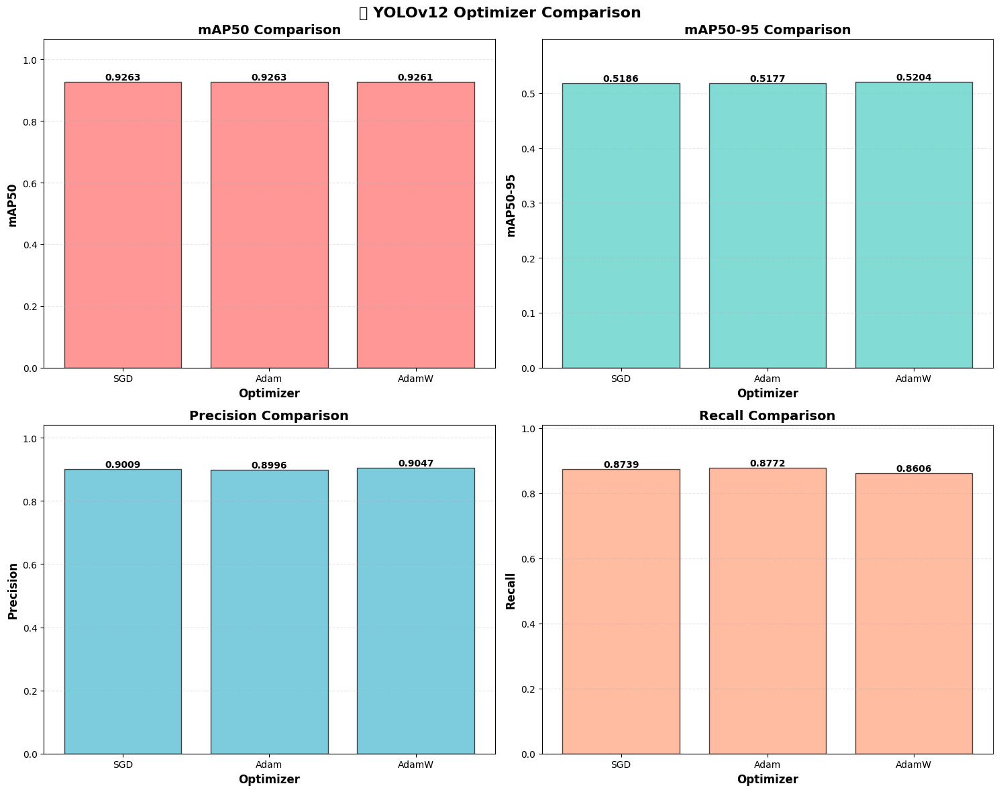

In [ ]:
DATA_YAML = "/content/My-First-Project-4/data.yaml"
results = run_all_experiments(DATA_YAML, experiments)
print_results_table(results)
df = plot_results_comparison(results)

In [ ]:
!zip -r runs.zip /content/runs

  adding: content/runs/ (stored 0%)
  adding: content/runs/detect/ (stored 0%)
  adding: content/runs/detect/3_Optimizer_AdamW/ (stored 0%)
  adding: content/runs/detect/3_Optimizer_AdamW/BoxF1_curve.png (deflated 15%)
  adding: content/runs/detect/3_Optimizer_AdamW/val_batch0_labels.jpg (deflated 2%)
  adding: content/runs/detect/3_Optimizer_AdamW/train_batch2.jpg (deflated 1%)
  adding: content/runs/detect/3_Optimizer_AdamW/results.png (deflated 8%)
  adding: content/runs/detect/3_Optimizer_AdamW/val_batch1_labels.jpg (deflated 5%)
  adding: content/runs/detect/3_Optimizer_AdamW/train_batch1200.jpg (deflated 3%)
  adding: content/runs/detect/3_Optimizer_AdamW/train_batch1.jpg (deflated 2%)
  adding: content/runs/detect/3_Optimizer_AdamW/BoxPR_curve.png (deflated 21%)
  adding: content/runs/detect/3_Optimizer_AdamW/val_batch0_pred.jpg (deflated 2%)
  adding: content/runs/detect/3_Optimizer_AdamW/train_batch0.jpg (deflated 1%)
  adding: content/runs/detect/3_Optimizer_AdamW/train_batch

In [ ]:
from pytorch_grad_cam import GradCAM, GradCAMPlusPlus, EigenCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

2025/11/15 00:41:39 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


In [ ]:
def visualize_yolo_attention(model_path, image_path, save_dir='gradcam_results'):
    """
    Visualize YOLO attention using feature map analysis
    (Better approach for YOLO than traditional Grad-CAM)
    """

    print(f"\n{'='*70}")
    print("🔥 GENERATING ATTENTION VISUALIZATION")
    print(f"{'='*70}\n")

    os.makedirs(save_dir, exist_ok=True)

    # Load model
    model = YOLO(model_path)
    model.model.eval()

    # Read image
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]

    # Get predictions
    results = model(image_path, verbose=False)

    if len(results[0].boxes) == 0:
        print("⚠️  No objects detected!")
        return None

    # Get feature maps from backbone
    feature_maps = {}

    def hook_fn(name):
        def hook(module, input, output):
            feature_maps[name] = output.detach()
        return hook

    # Register hooks on key layers
    hooks = []
    layer_names = []

    for name, module in model.model.named_modules():
        # Target specific layers in backbone
        if any(x in name for x in ['model.9', 'model.12', 'model.15', 'model.18', 'model.21']):
            if isinstance(module, (torch.nn.Conv2d, torch.nn.modules.conv.Conv2d)):
                hooks.append(module.register_forward_hook(hook_fn(name)))
                layer_names.append(name)
                if len(layer_names) >= 3:  # Limit to 3 layers
                    break

    # Forward pass to get feature maps
    _ = model(image_path, verbose=False)

    # Remove hooks
    for hook in hooks:
        hook.remove()

    if not feature_maps:
        print("⚠️  No feature maps captured!")
        return None

    # Create visualization
    num_layers = len(feature_maps)
    fig, axes = plt.subplots(2, num_layers + 1, figsize=(6 * (num_layers + 1), 12))

    if num_layers == 1:
        axes = axes.reshape(2, -1)

    fig.suptitle(f'YOLO Attention Maps - {os.path.basename(image_path)}',
                 fontsize=16, fontweight='bold')

    # Original image with detections
    axes[0, 0].imshow(img_rgb)
    for box in results[0].boxes:
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
        cls_id = int(box.cls[0])
        conf = float(box.conf[0])
        label = f"{results[0].names[cls_id]} {conf:.2f}"

        rect = plt.Rectangle((x1, y1), x2-x1, y2-y1,
                            fill=False, color='lime', linewidth=3)
        axes[0, 0].add_patch(rect)
        axes[0, 0].text(x1, y1-10, label,
                       bbox=dict(boxstyle='round', facecolor='lime', alpha=0.8),
                       fontsize=10, fontweight='bold')
    axes[0, 0].set_title('Original + Detections', fontsize=12, fontweight='bold')
    axes[0, 0].axis('off')

    axes[1, 0].imshow(img_rgb)
    axes[1, 0].set_title('Reference Image', fontsize=12, fontweight='bold')
    axes[1, 0].axis('off')

    # Process each feature map
    for idx, (layer_name, fmap) in enumerate(feature_maps.items(), 1):
        # Average across channels
        fmap_avg = fmap[0].mean(dim=0).cpu().numpy()

        # Normalize
        fmap_normalized = (fmap_avg - fmap_avg.min()) / (fmap_avg.max() - fmap_avg.min() + 1e-8)

        # Resize to original image size
        fmap_resized = cv2.resize(fmap_normalized, (w, h))

        # Show heatmap
        axes[0, idx].imshow(fmap_resized, cmap='jet')
        axes[0, idx].set_title(f'Layer: {layer_name.split(".")[-1]}\nAttention Map',
                              fontsize=10, fontweight='bold')
        axes[0, idx].axis('off')

        # Overlay on image
        img_normalized = img_rgb.astype(np.float32) / 255.0
        heatmap = cv2.applyColorMap(np.uint8(255 * fmap_resized), cv2.COLORMAP_JET)
        heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
        overlay = 0.6 * img_normalized + 0.4 * heatmap
        overlay = np.clip(overlay, 0, 1)

        axes[1, idx].imshow(overlay)

        # Add boxes to overlay
        for box in results[0].boxes:
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
            rect = plt.Rectangle((x1, y1), x2-x1, y2-y1,
                                fill=False, color='lime', linewidth=2)
            axes[1, idx].add_patch(rect)

        axes[1, idx].set_title(f'Overlay + Detections', fontsize=10, fontweight='bold')
        axes[1, idx].axis('off')

    plt.tight_layout()

    # Save
    base_name = os.path.splitext(os.path.basename(image_path))[0]
    save_path = os.path.join(save_dir, f'attention_{base_name}.png')
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    print(f"✅ Saved: {save_path}")

    plt.show()

    return save_path


🔥 GENERATING ATTENTION VISUALIZATION

✅ Saved: gradcam_results/attention_1000007011_jpg.rf.25c591a1838b2e8032fd8d9c731ea9df.png


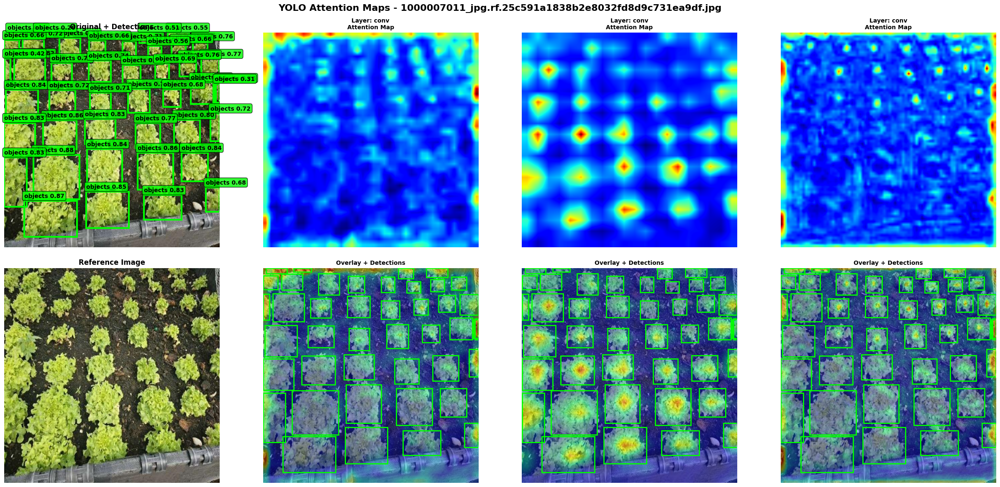

'gradcam_results/attention_1000007011_jpg.rf.25c591a1838b2e8032fd8d9c731ea9df.png'

In [ ]:
visualize_yolo_attention(
    model_path='/content/runs/detect/1_Baseline_SGD/weights/best.pt',
    image_path='/content/My-First-Project-4/test/images/1000007011_jpg.rf.25c591a1838b2e8032fd8d9c731ea9df.jpg'
)


In [ ]:
!ps aux | grep mlflow

root        6546  0.0  0.0      0     0 ?        Z    Nov14   0:02 [mlflow] <defunct>
root       38521  0.0  0.0   7376  3328 ?        S    01:31   0:00 /bin/bash -c ps aux | grep mlflow
root       38523  0.0  0.0   6484  2136 ?        S    01:31   0:00 grep mlflow
